# Fetching connectomes and plotting on surface

In [4]:
# Set the environment
import os
import glob
import numpy as np
import nibabel as nib
from brainspace.plotting import plot_hemispheres
from brainspace.mesh.mesh_io import read_surface
from brainspace.datasets import load_conte69
from brainspace.gradient import GradientMaps
from brainspace.utils.parcellation import map_to_labels
import matplotlib.pyplot as plt
import cmocean

# Add cmocean maps to cmaps variable
cmaps = cmocean.cm.cmap_d

# NaN color
nan_col = (0.8, 0.8, 0.8, 1)

# Set the working directory to the 'out' directory
out='/data_/mica3/BIDS_MICs/derivatives'
os.chdir(out)     # <<<<<<<<<<<< CHANGE THIS PATH

# This variable will be different for each subject
sub='HC062' # <<<<<<<<<<<< CHANGE THIS SUBJECT's ID
ses='01'    # <<<<<<<<<<<< CHANGE THIS SUBJECT's SESSION
subjectID=f'sub-{sub}_ses-{ses}'           
subjectDir=f'micapipe_v0.2.0/sub-{sub}/ses-{ses}' 

# Path to MICAPIPE from global enviroment
micapipe=os.popen("echo $MICAPIPE").read()[:-1] # <<<<<<<<<<<< CHANGE THIS PATH

# All parcelations list
parc = ['aparc-a2009s', 'aparc', 'economo', 'glasser-360',
         'schaefer-100','schaefer-200','schaefer-300','schaefer-400',
         'schaefer-500','schaefer-600','schaefer-700','schaefer-800',
         'schaefer-900','schaefer-1000','vosdewael-100','vosdewael-200',
         'vosdewael-300','vosdewael-400']

# Load fsLR-5k inflated (9684 vertices)
f5k_lh = read_surface(f'{micapipe}/surfaces/fsLR-5k.L.inflated.surf.gii', itype='gii')
f5k_rh = read_surface(f'{micapipe}/surfaces/fsLR-5k.R.inflated.surf.gii', itype='gii')

# Load fsLR-32k inflated (64984 vertices)
f32k_lh = read_surface(f'{micapipe}/surfaces/fsLR-32k.L.inflated.surf.gii', itype='gii')
f32k_rh = read_surface(f'{micapipe}/surfaces/fsLR-32k.R.inflated.surf.gii', itype='gii')

# Load fsaverage5 inflated (20484 vertices)
fs5_lh = read_surface(f'{micapipe}/surfaces/fsaverage5/surf/lh.inflated', itype='fs')
fs5_rh = read_surface(f'{micapipe}/surfaces/fsaverage5/surf/rh.inflated', itype='fs')

def load_annot(atlas, surf='fsaverage5'):
    '''
    Script that loads the labels of an specific parcellation and generates a midwall mask
    '''
    
    # Load LEFT annotation file in fsaverage5
    annot_lh_fs5= nib.freesurfer.read_annot(f'{micapipe}/parcellations/lh.{atlas}_mics.annot')

    # Unique number of labels of a given atlas
    Ndim = max(np.unique(annot_lh_fs5[0]))
    
    if surf == 'fsaverage5':

        # Load RIGHT annotation file in fsaverage5
        annot_rh_fs5= nib.freesurfer.read_annot(f'{micapipe}/parcellations/rh.{atlas}_mics.annot')[0]+Ndim

        # replace with 0 the medial wall of the right labels
        annot_rh_fs5 = np.where(annot_rh_fs5==Ndim, 0, annot_rh_fs5) 

        # fsaverage5 labels
        labels = np.concatenate((annot_lh_fs5[0], annot_rh_fs5), axis=0)
    
    else:
        # Read label for fsLR-32k
        labels = np.loadtxt(open(f'{micapipe}/parcellations/{atlas}_conte69.csv'), dtype=int)

    # mask of the medial wall
    mask = labels != 0
    
    # Midwall labels of aparc-a2009s are lh=42 and rh=117
    if atlas == 'aparc-a2009s' and surf == 'fsaverage5':
        mask[(labels == 117) | (labels == 42)] = 0
    
    #print(f'{atlas}; midwall = {Ndim}, length = {str(labels.shape)}')
    
    return(labels, mask, Ndim)


In [5]:
def load_mpc(File, Ndim):
    """Loads and process a MPC"""

    # load the matrix
    mtx_mpc = nib.load(File).darrays[0].data

    # Mirror the matrix
    MPC = np.triu(mtx_mpc,1)+mtx_mpc.T

    # Remove the medial wall
    MPC = np.delete(np.delete(MPC, 0, axis=0), 0, axis=1)
    MPC = np.delete(np.delete(MPC, Ndim, axis=0), Ndim, axis=1)
    
    return(MPC)

def load_fc(File, Ndim, parc=''):
    """Loads and process a functional connectome"""

    # load the matrix
    mtx_fs = nib.load(File).darrays[0].data

    # slice the matrix remove subcortical nodes and cerebellum
    FC = mtx_fs[49:, 49:]
    
    # Fisher transform
    FCz = np.arctanh(FC)

    # replace inf with 0
    FCz[~np.isfinite(FCz)] = 0

    # Mirror the matrix
    FCz = np.triu(FCz,1)+FCz.T
    return(FCz)

def load_gd(File, Ndim):
    """Loads and process a GD"""

    # load the matrix
    mtx_gd = nib.load(File).darrays[0].data

    # Remove the Mediall Wall
    mtx_gd = np.delete(np.delete(mtx_gd, 0, axis=0), 0, axis=1)
    GD = np.delete(np.delete(mtx_gd, Ndim, axis=0), Ndim, axis=1)

    return(GD)

def load_sc(File, Ndim, log_transform=True):
    """Loads and process a structura connectome"""

    # load the matrix
    mtx_sc = nib.load(File).darrays[0].data

    # Mirror the matrix
    if log_transform != True:
        mtx_sc = np.triu(mtx_sc,1)+mtx_sc.T
    else:
        mtx_sc = np.log(np.triu(mtx_sc,1)+mtx_sc.T)
    mtx_sc[np.isneginf(mtx_sc)] = 0

    # slice the matrix remove subcortical nodes and cerebellum
    SC = mtx_sc[49:, 49:]
    SC = np.delete(np.delete(SC, Ndim, axis=0), Ndim, axis=1)

    # replace 0 values with almost 0
    SC[SC==0] = np.finfo(float).eps
    
    return(SC)

In [6]:
def load_connectomes(connectome_type, parc, subjectDir, subjectID):
    """
    Load the specified connectome type and return roi_32k and roi_fs5.

    Parameters:
    connectome_type (str): Type of connectome to load. Options are 'GD', 'SC', 'MPC', 'FC'.
    subjectDir (str): Directory containing the subject data.
    subjectID (str): Subject ID.

    Returns:
    tuple: roi_32k and roi_fs5 arrays if successful, None otherwise.
    """
    
    # Empty list of surface plots
    roi_fs5 = [None] * len(parc)
    roi_32k = [None] * len(parc)

    for i, atlas in enumerate(parc):

        # Load fsaverage5 labels
        labels_fs5, mask_fs5, Ndim = load_annot(atlas, surf='fsaverage5')

        # Load fsLR-32k labels
        labels_32k, mask_32k, _ = load_annot(atlas, surf='fsLR-32k')

        try:
            if connectome_type == 'GD':
                # Load Geodesic Distance connectome
                file = f'{subjectDir}/dist/{subjectID}_atlas-{atlas}_GD.shape.gii'
                mtx = load_gd(file, Ndim)
            elif connectome_type == 'SC':
                # Load Structural Connectome
                file = f'{subjectDir}/dwi/connectomes/{subjectID}_space-dwi_atlas-{atlas}_desc-iFOD2-40M-SIFT2_full-connectome.shape.gii'
                mtx = load_sc(file, Ndim)
            elif connectome_type == 'MPC':
                # Load MPC
                acq_mpc = 'T1map'
                file = f'{subjectDir}/mpc/acq-{acq_mpc}/{subjectID}_atlas-{atlas}_desc-MPC.shape.gii'
                mtx = load_mpc(file, Ndim)
            elif connectome_type == 'FC':
                # Load Functional Connectome
                acq_func = 'se_task-rest_acq-AP_bold'
                file = f'{subjectDir}/func/desc-{acq_func}/surf/{subjectID}_surf-fsLR-32k_atlas-{atlas}_desc-FC.shape.gii'
                mtx = load_fc(file, Ndim)
            else:
                raise ValueError("Invalid connectome type. Choose from 'GD', 'SC', 'MPC', 'FC'.")
                
            # Column sum
            mtx_s = np.sum(mtx, axis=0)

            # Map labels to surface fsaverage5
            roi_fs5[i] = map_to_labels(mtx_s, labels_fs5, fill=np.nan, mask=mask_fs5)

            # Map labels to surface fsLR-32k
            roi_32k[i] = map_to_labels(mtx_s, labels_32k, fill=np.nan, mask=mask_32k)
        
        except Exception as e:
            print(f"Error loading {connectome_type} connectome for atlas {atlas}: {e}")
            continue
            
    return roi_fs5, roi_32k


# GD connectomes on `fsLR-32k`

Error loading GD connectome for atlas aparc-a2009s: There are more target labels than source values.


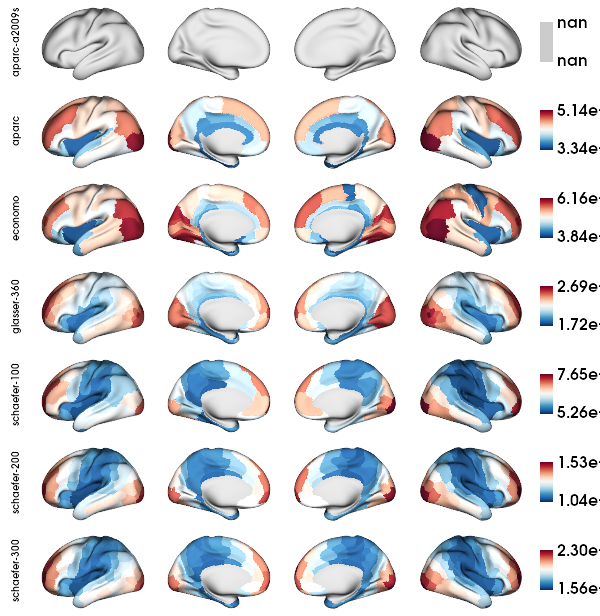

In [7]:
# Load the connectome row sum for each parcellation
roi_fs5, roi_32k = load_connectomes('GD', parc, subjectDir, subjectID)

# Plot parcellations
plot_hemispheres(f32k_lh, f32k_rh, array_name=roi_32k[0:7], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[0:7]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

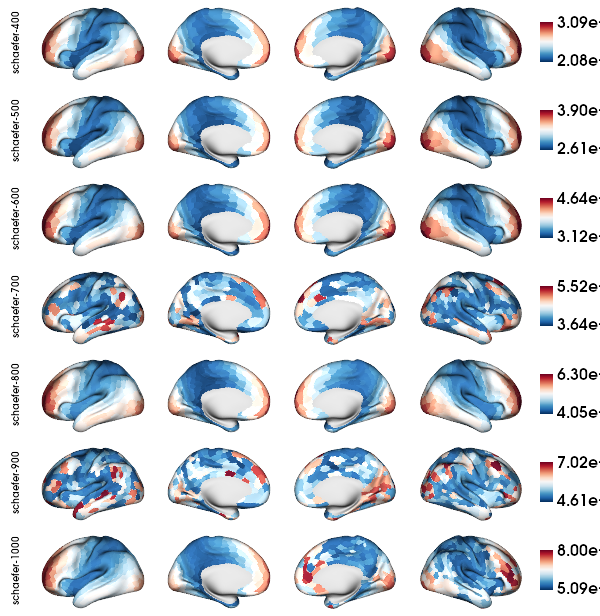

In [8]:
# Plot parcellations
plot_hemispheres(f32k_lh, f32k_rh, array_name=roi_32k[7:14], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[7:14]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

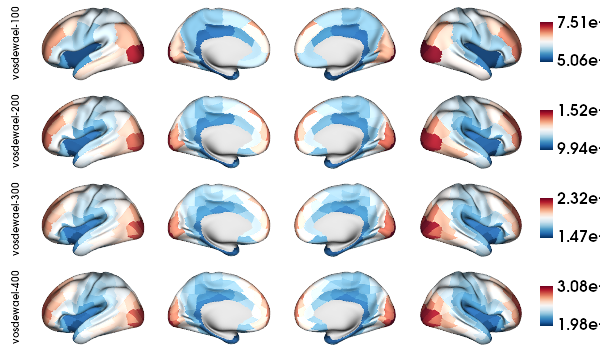

In [9]:
# Plot parcellations
plot_hemispheres(f32k_lh, f32k_rh, array_name=roi_32k[14:18], size=(600, 88*4), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[14:18]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

# GD matrices on `fsaverage5`

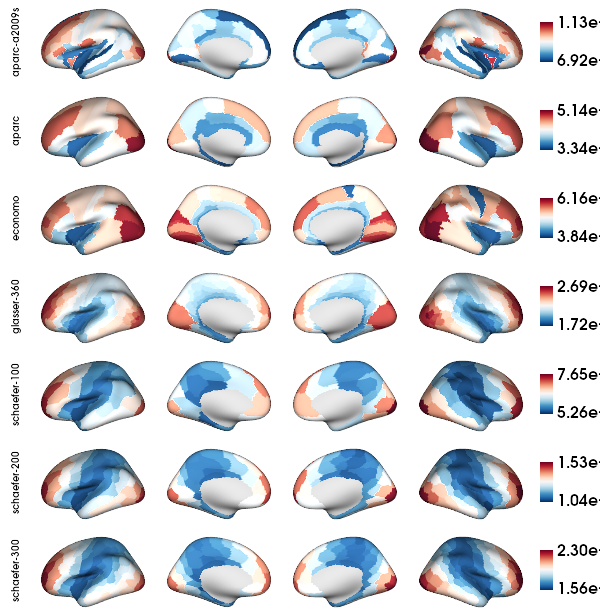

In [10]:
# Plot parcellations
plot_hemispheres(fs5_lh, fs5_rh, array_name=roi_fs5[0:7], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[0:7]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

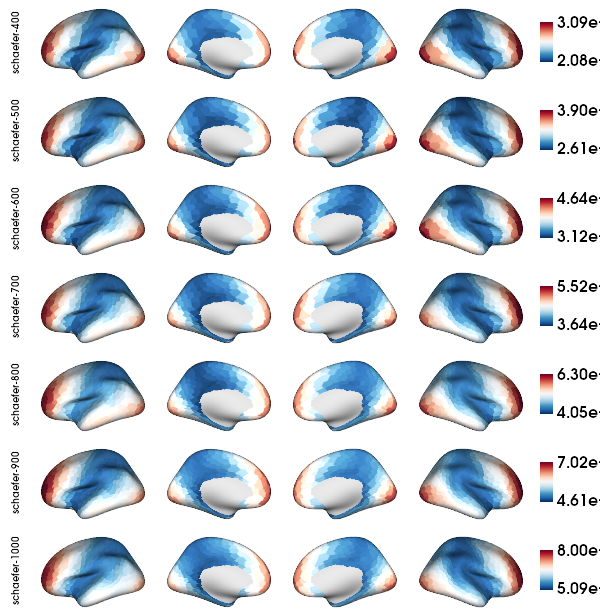

In [11]:
# Plot parcellations
plot_hemispheres(fs5_lh, fs5_rh, array_name=roi_fs5[7:14], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[7:14]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

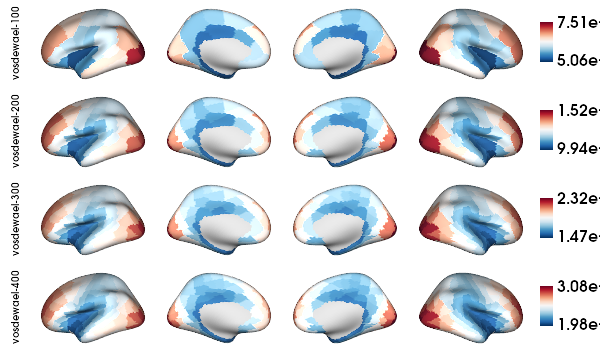

In [12]:
# Plot parcellations
plot_hemispheres(fs5_lh, fs5_rh, array_name=roi_fs5[14:18], size=(600, 88*4), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[14:18]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

# Structural connectome matrices on `fsLR-32k`

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_30596/3481715255.py:57: RuntimeWarning: divide by zero encountered in log
  mtx_sc = np.log(np.triu(mtx_sc,1)+mtx_sc.T)


Error loading SC connectome for atlas aparc-a2009s: There are more target labels than source values.


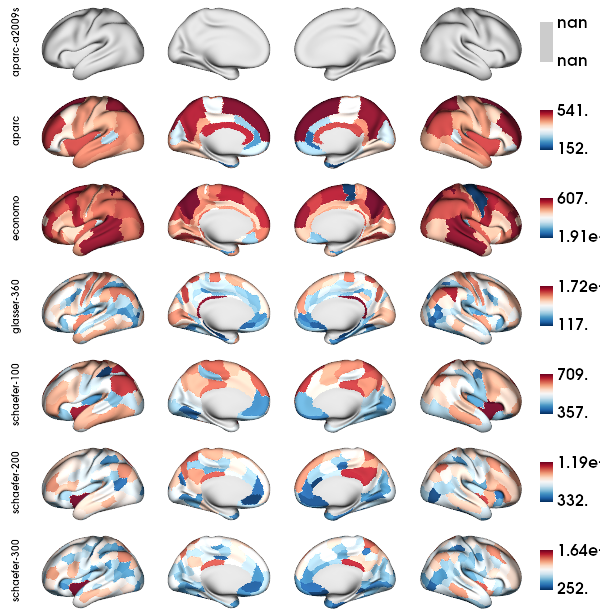

In [13]:
# Load the connectome row sum for each parcellation
roi_fs5, roi_32k = load_connectomes('SC', parc, subjectDir, subjectID)

# Plot parcellations
plot_hemispheres(f32k_lh, f32k_rh, array_name=roi_32k[0:7], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[0:7]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

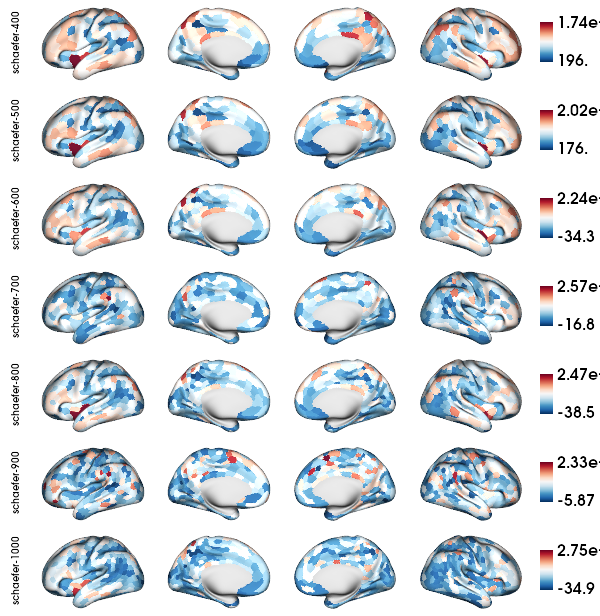

In [14]:
# Plot parcellations
plot_hemispheres(f32k_lh, f32k_rh, array_name=roi_32k[7:14], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[7:14]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

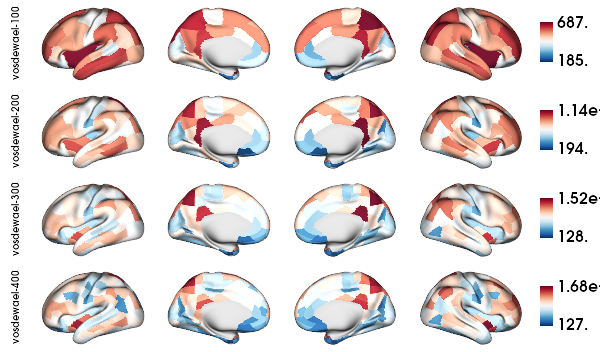

In [15]:
# Plot parcellations
plot_hemispheres(f32k_lh, f32k_rh, array_name=roi_32k[14:18], size=(600, 88*4), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[14:18]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

# Structural connectome matrices on `fsaverage5`

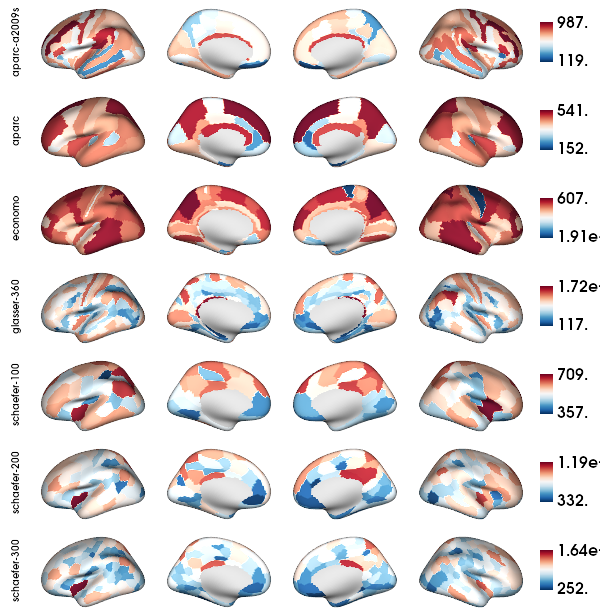

In [16]:
# Plot parcellations
plot_hemispheres(fs5_lh, fs5_rh, array_name=roi_fs5[0:7], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[0:7]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

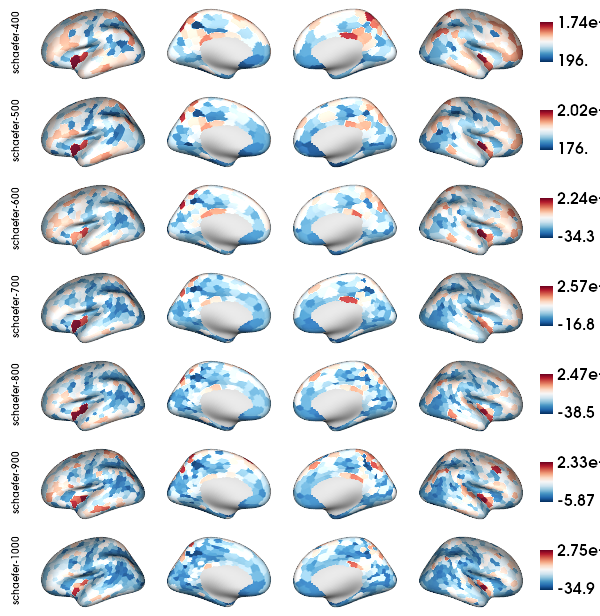

In [17]:
# Plot parcellations
plot_hemispheres(fs5_lh, fs5_rh, array_name=roi_fs5[7:14], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[7:14]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

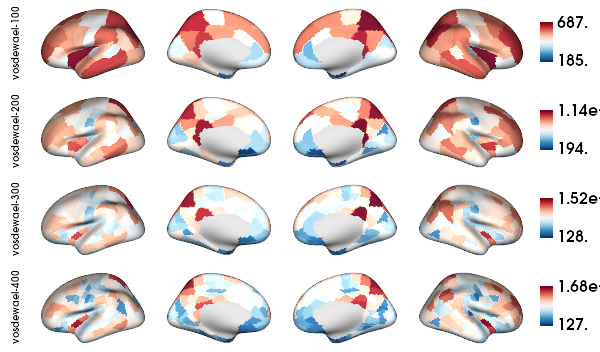

In [18]:
# Plot parcellations
plot_hemispheres(fs5_lh, fs5_rh, array_name=roi_fs5[14:18], size=(600, 88*4), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[14:18]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

# MPC matrices on `fsLR-32k`

Error loading MPC connectome for atlas aparc-a2009s: There are more target labels than source values.


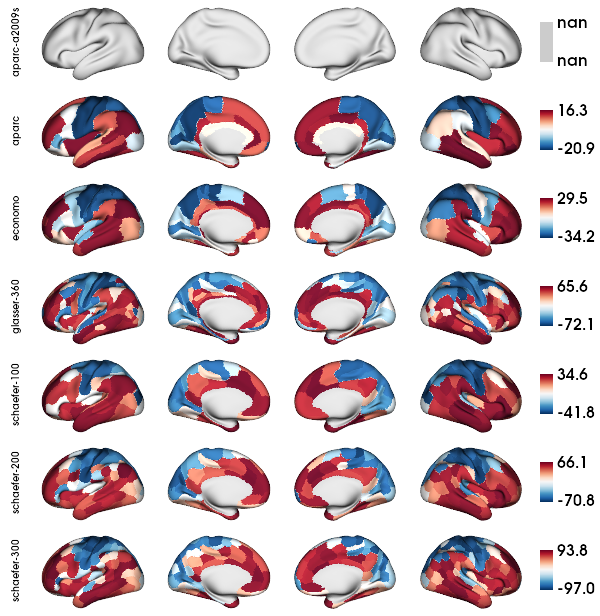

In [19]:
# Load the connectome row sum for each parcellation
roi_fs5, roi_32k = load_connectomes('MPC', parc, subjectDir, subjectID)

# Plot parcellations
plot_hemispheres(f32k_lh, f32k_rh, array_name=roi_32k[0:7], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[0:7]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

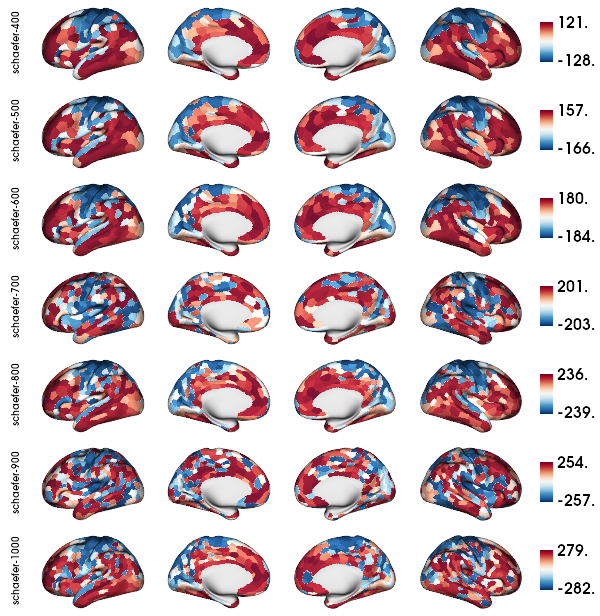

In [20]:
# Plot parcellations
plot_hemispheres(f32k_lh, f32k_rh, array_name=roi_32k[7:14], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[7:14]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

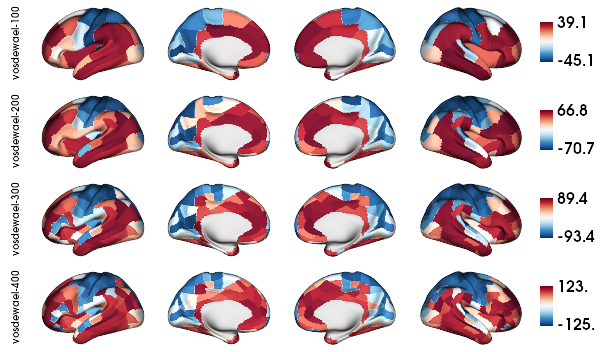

In [21]:
# Plot parcellations
plot_hemispheres(f32k_lh, f32k_rh, array_name=roi_32k[14:18], size=(600, 88*4), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[14:18]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

# MPC matrices on `fsaverage5`

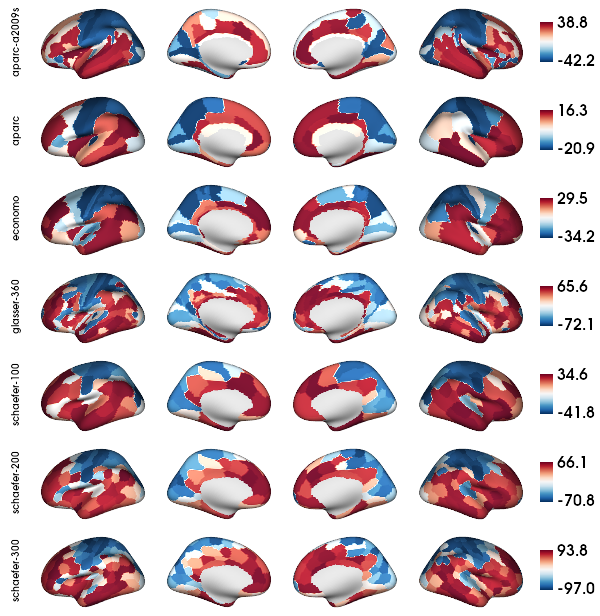

In [22]:
# Plot parcellations
plot_hemispheres(fs5_lh, fs5_rh, array_name=roi_fs5[0:7], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[0:7]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

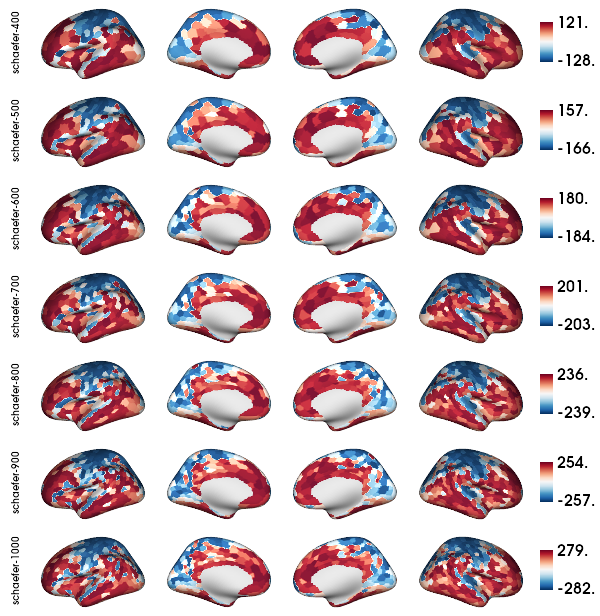

In [23]:
# Plot parcellations
plot_hemispheres(fs5_lh, fs5_rh, array_name=roi_fs5[7:14], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[7:14]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

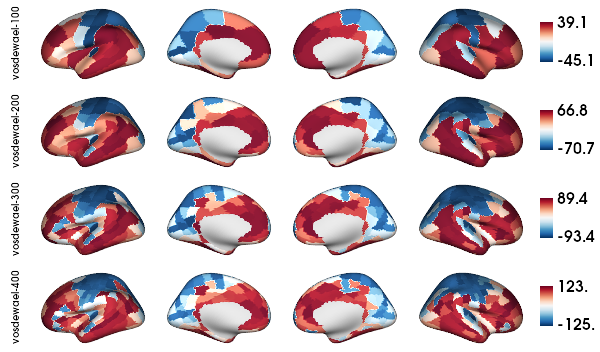

In [24]:
# Plot parcellations
plot_hemispheres(fs5_lh, fs5_rh, array_name=roi_fs5[14:18], size=(600, 88*4), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[14:18]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

# Functional Connectomes matrices on `fsLR-32k`

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_30596/3481715255.py:26: RuntimeWarning: divide by zero encountered in arctanh
  FCz = np.arctanh(FC)


Error loading FC connectome for atlas schaefer-1000: There are more target labels than source values.


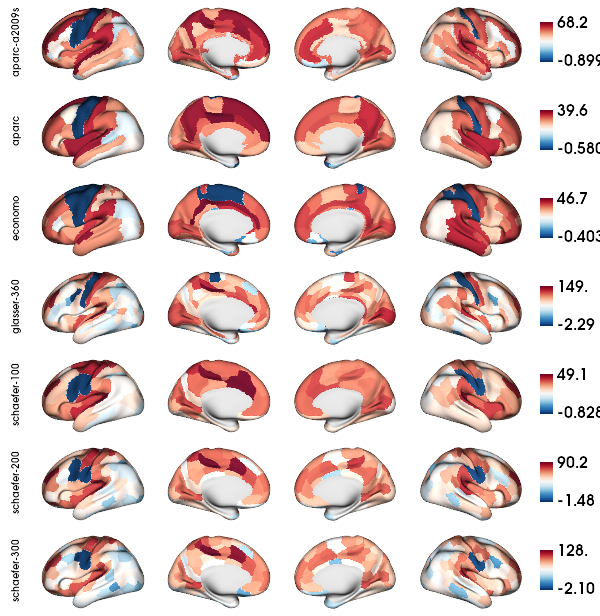

In [25]:
# Load the connectome row sum for each parcellation
roi_fs5, roi_32k = load_connectomes('FC', parc, subjectDir, subjectID)

# Plot parcellations
plot_hemispheres(f32k_lh, f32k_rh, array_name=roi_32k[0:7], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[0:7]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

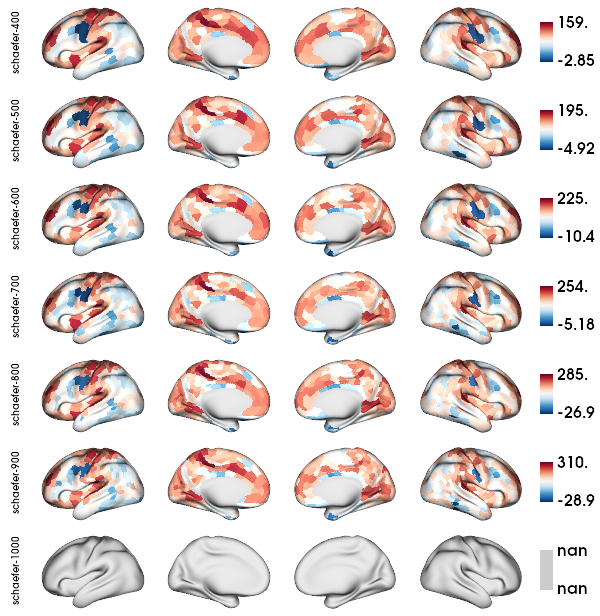

In [26]:
# Plot parcellations
plot_hemispheres(f32k_lh, f32k_rh, array_name=roi_32k[7:14], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[7:14]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

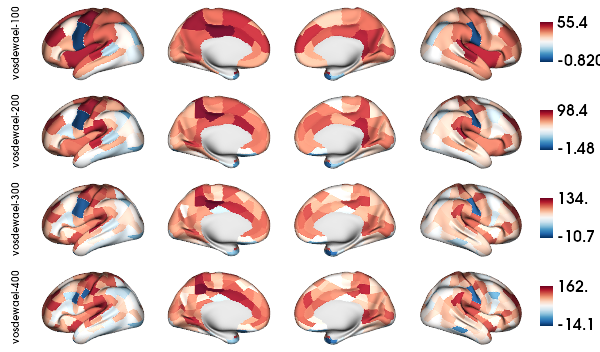

In [27]:
# Plot parcellations
plot_hemispheres(f32k_lh, f32k_rh, array_name=roi_32k[14:18], size=(600, 88*4), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[14:18]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

# Functional Connectomes on `fsaverage5`

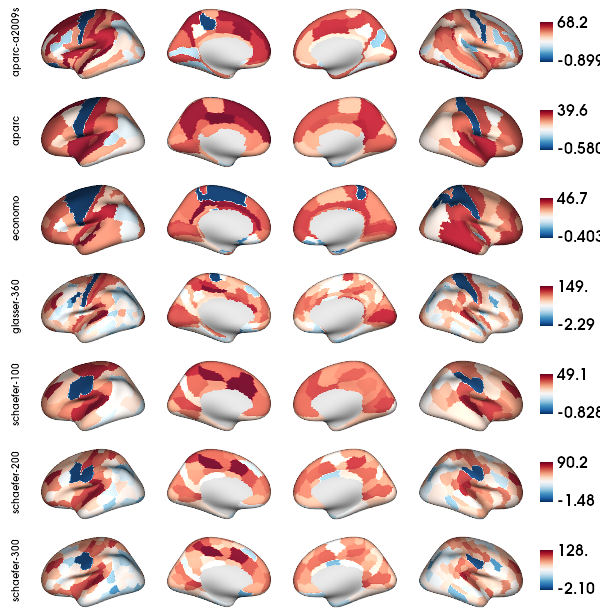

In [28]:
# Plot parcellations
plot_hemispheres(fs5_lh, fs5_rh, array_name=roi_fs5[0:7], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[0:7]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

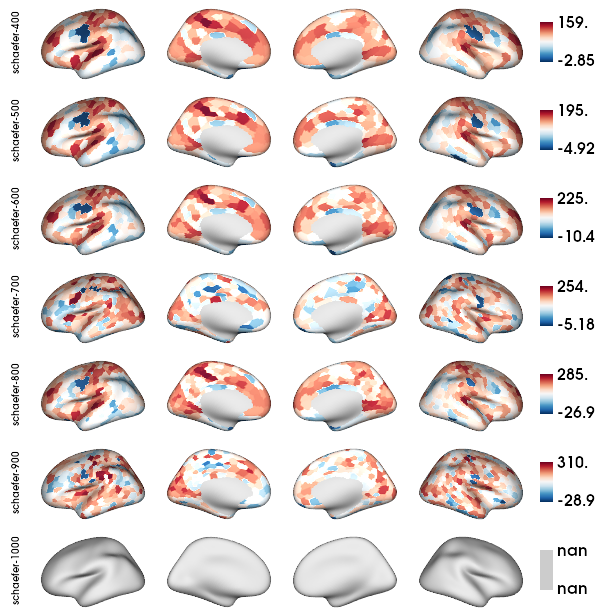

In [29]:
# Plot parcellations
plot_hemispheres(fs5_lh, fs5_rh, array_name=roi_fs5[7:14], size=(600, 88*7), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[7:14]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)

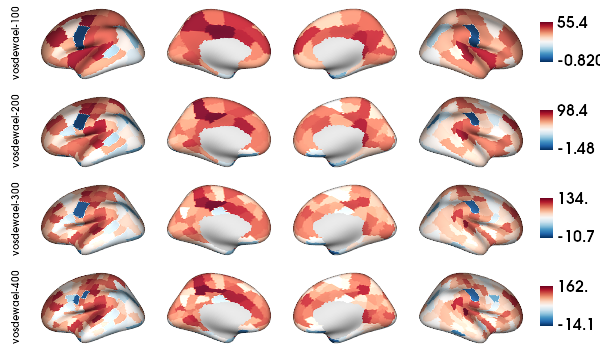

In [30]:
# Plot parcellations
plot_hemispheres(fs5_lh, fs5_rh, array_name=roi_fs5[14:18], size=(600, 88*4), cmap='RdBu_r',
                 embed_nb=True, label_text={'left':parc[14:18]}, color_bar='right',
                 zoom=1.5, nan_color=nan_col)